In [2]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import missingno
import seaborn as sns
#from pandas.tools.plotting import scatter_matrix
from pandas.plotting import scatter_matrix
from mpl_toolkits.mplot3d import Axes3D

from sklearn.feature_selection import RFE,RFECV
from sklearn.svm import SVR
from sklearn.decomposition import PCA
from sklearn.preprocessing import OneHotEncoder,LabelEncoder,label_binarize

import sklearn.ensemble as ske
from sklearn import datasets,model_selection,tree,preprocessing,metrics,linear_model
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LinearRegression,LogisticRegression,Ridge,Lasso,SGDClassifier
from sklearn.tree import DecisionTreeClassifier
import tensorflow as tf

import scipy.stats as st
from scipy.stats import randint as sp_randint
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

from sklearn.metrics import precision_recall_fscore_support,roc_curve,auc

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

In [3]:
#读取数据
headers = ['age','workclass','fnlwgt','education','education-num','marital-status','occupation','relationship','race','sex','capital-gain','capital-loss','hours-per-week','native-country','class'] 


#训练数据集
training_raw = pd.read_csv('dataset/adult.data',header=None,names=headers,sep=',\s',na_values=["?"],engine='python',usecols=['workclass', 'occupation', 'hours-per-week','class'])
#测试数据集
test_raw = pd.read_csv('dataset/adult.test',header=None,names=headers,sep=',\s',na_values=["?"],engine='python',usecols=['workclass', 'occupation', 'hours-per-week','class'])

In [4]:
#数据展示
dataset_raw = training_raw.append(test_raw)
dataset_raw.reset_index(inplace=True)
dataset_raw.drop('index',inplace=True,axis=1)
dataset_raw.head()

,workclass,occupation,hours-per-week,class
0,State-gov,Adm-clerical,40.0,<=50K
1,Self-emp-not-inc,Exec-managerial,13.0,<=50K
2,Private,Handlers-cleaners,40.0,<=50K
3,Private,Handlers-cleaners,40.0,<=50K
4,Private,Prof-specialty,40.0,<=50K


In [5]:
#展示数据特征值-所有数值型
dataset_raw.describe()

,hours-per-week
count,48842.000000
mean,40.422382
std,12.391444
min,1.000000
25%,40.000000
50%,40.000000
75%,45.000000
max,99.000000


In [6]:
#展示数据特征值-所有种类
dataset_raw.describe(include=['O'])

,workclass,occupation,class
count,46043,46033,48842
unique,8,14,4
top,Private,Prof-specialty,<=50K
freq,33906,6172,24720


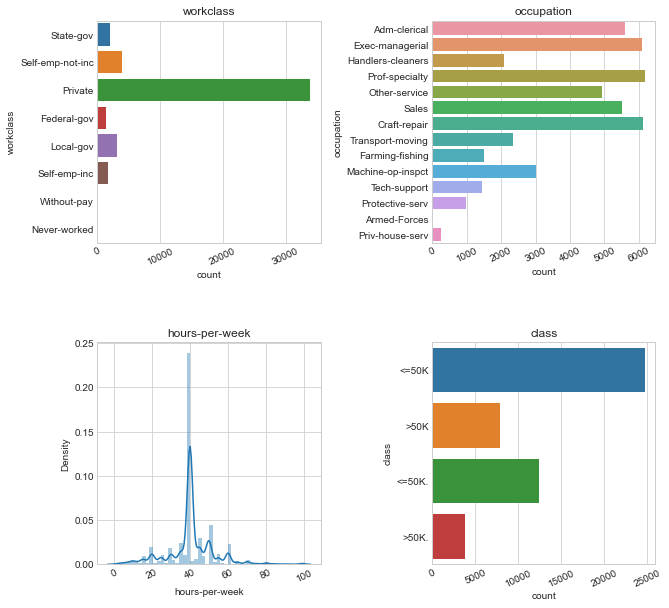

In [7]:
#单特征展示
import math
#展示函数
def plot_distribution(dataset,cols=5,width=40,height=40,hspace=0.2,wspace=0.5):
    plt.style.use('seaborn-whitegrid')
    fig = plt.figure(figsize=(width,height))
    fig.subplots_adjust(left=None,bottom=None,right=None,top=None,wspace=wspace,hspace=hspace)
    rows = math.ceil(float(dataset.shape[1]) / cols)
    for i,column in enumerate(dataset.columns):
        ax = fig.add_subplot(rows,cols,i + 1)
        ax.set_title(column)
        if dataset.dtypes[column] == np.object:
            g = sns.countplot(y=column,data=dataset)
            substrings = [s.get_text()[:18] for s in g.get_yticklabels()]
            g.set(yticklabels=substrings)
            plt.rcParams['savefig.dpi'] = 1200 #图片像素
            plt.rcParams['figure.dpi'] = 1200 #分辨率
            plt.xticks(rotation=25)
        else:
            g = sns.distplot(dataset[column])
            plt.rcParams['savefig.dpi'] = 1200 #图片像素
            plt.rcParams['figure.dpi'] = 1200 #分辨率
            plt.xticks(rotation=25)
plot_distribution(dataset_raw,cols=2,width=10,height=10,hspace=0.45,wspace=0.5)

In [8]:
#缺失值显示1
missingno.matrix(dataset_raw,figsize=(20,5))

<AxesSubplot:>

In [9]:
#缺失值显示2
missingno.bar(dataset_raw,sort='ascending',figsize=(20,5))

<AxesSubplot:>

<AxesSubplot:xlabel='count', ylabel='class'>

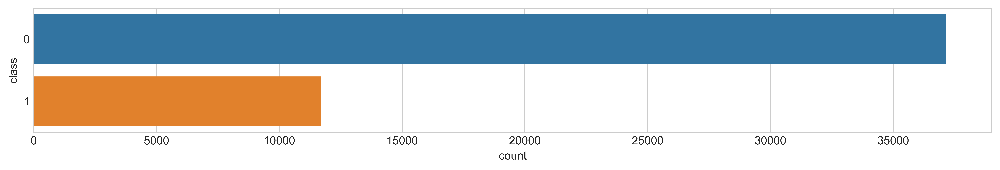

In [10]:
#标签转换，如果收入大于50k为1，收入小于50k为0
dataset_bin = pd.DataFrame()
dataset_con = pd.DataFrame()

dataset_raw.loc[dataset_raw['class'] == '>50K','class'] = 1
dataset_raw.loc[dataset_raw['class'] == '>50K.','class'] = 1
dataset_raw.loc[dataset_raw['class'] == '<=50K','class'] = 0
dataset_raw.loc[dataset_raw['class'] == '<=50K.','class'] = 0

dataset_bin['class'] = dataset_raw['class']
dataset_con['class'] = dataset_raw['class']

#数据不均衡时
plt.style.use('seaborn-whitegrid')
plt.rcParams['savefig.dpi'] = 1200 #图片像素
plt.rcParams['figure.dpi'] = 1200 #分辨率
fig = plt.figure(figsize=(15,2))
sns.countplot(y="class",data=dataset_bin)

In [11]:
#单变量分析
#hours-per-week连续值离散化
dataset_bin['hours-per-week'] = pd.cut(dataset_raw['hours-per-week'],6)
dataset_con['hours-per-week'] = dataset_raw['hours-per-week']
#左图是切分后，有图是根据收入划分
plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(20,4))
plt.subplot(1,2,1)
sns.countplot(y='hours-per-week',data=dataset_bin);
plt.subplot(1,2,2)
sns.distplot(dataset_con['hours-per-week'])
#sns.distplot(dataset_con.loc[dataset_con['class'] == 1]['hours-per-week'],kde_kws={"label":">50K"});
#sns.distplot(dataset_con.loc[dataset_con['class'] == 0]['hours-per-week'],kde_kws={"label":"<50K"});

<AxesSubplot:xlabel='hours-per-week', ylabel='Density'>

In [12]:
#对工作种类workclass归类

#没有工作
dataset_raw.loc[dataset_raw['workclass'] == 'Without-pay','workclass'] = 'Not Working'
dataset_raw.loc[dataset_raw['workclass'] == 'Never-worked','workclass'] = 'Not Working'
#
dataset_raw.loc[dataset_raw['workclass'] == 'Federal-gov','workclass'] = 'Fed-gov'
#
dataset_raw.loc[dataset_raw['workclass'] == 'State-gov','workclass'] = 'Non-fed-gov'
dataset_raw.loc[dataset_raw['workclass'] == 'Local-gov','workclass'] = 'Non-fed-gov'
#
dataset_raw.loc[dataset_raw['workclass'] == 'Self-emp-not-inc','workclass'] = 'Self-emp'
dataset_raw.loc[dataset_raw['workclass'] == 'Self-emp-inc','workclass'] = 'Self-emp'

dataset_bin['workclass'] = dataset_raw['workclass']
dataset_con['workclass'] = dataset_raw['workclass']

plt.style.use('seaborn-whitegrid')
plt.figure(figsize=(10,5))
sns.countplot(y="workclass",data=dataset_bin)

<AxesSubplot:xlabel='count', ylabel='workclass'>

In [13]:
#对职业occupation进行分类
dataset_raw.loc[dataset_raw['occupation'] == 'Adm-clerical','occupation'] = 'Admin'
dataset_raw.loc[dataset_raw['occupation'] == 'Armed-Forces','occupation'] = 'Military'
dataset_raw.loc[dataset_raw['occupation'] == 'Craft-repair','occupation'] = 'Manual Labour'
dataset_raw.loc[dataset_raw['occupation'] == 'Exec-managerial','occupation'] = 'Office Labour'
dataset_raw.loc[dataset_raw['occupation'] == 'Farming-fishing','occupation'] = 'Manual Labour'
dataset_raw.loc[dataset_raw['occupation'] == 'Handlers-cleaners','occupation'] = 'Manual Labour'
dataset_raw.loc[dataset_raw['occupation'] == 'Machine-op-inspct','occupation'] = 'Manual Labour'
dataset_raw.loc[dataset_raw['occupation'] == 'Other-service','occupation'] = 'Service'
dataset_raw.loc[dataset_raw['occupation'] == 'Priv-house-serv','occupation'] = 'Service'
dataset_raw.loc[dataset_raw['occupation'] == 'Prof-specialty','occupation'] = 'Professional'
dataset_raw.loc[dataset_raw['occupation'] == 'Protective-serv','occupation'] = 'Military'
dataset_raw.loc[dataset_raw['occupation'] == 'Sales','occupation'] = 'Office Labour'
dataset_raw.loc[dataset_raw['occupation'] == 'Tech-support','occupation'] = 'Office Labour'
dataset_raw.loc[dataset_raw['occupation'] == 'Transport-moving','occupation'] = 'Manual Labour'

dataset_bin['occupation'] = dataset_raw['occupation']
dataset_con['occupation'] = dataset_raw['occupation']

plt.style.use('seaborn-whitegrid')
plt.figure(figsize=(10,5))
sns.countplot(y="occupation",data=dataset_bin)

<AxesSubplot:xlabel='count', ylabel='occupation'>

In [14]:
#双变量特征值
def plot_bivariate_bar(dataset,hue,cols=5,width=40,height=40,hspace=0.2,wspace=0.5):
    dataset = dataset.select_dtypes(include=[np.object])
    plt.style.use('seaborn-whitegrid')
    fig = plt.figure(figsize=(width,height))
    fig.subplots_adjust(left=None,bottom=None,right=None,top=None,wspace=wspace,hspace=hspace)
    rows = math.ceil(float(dataset.shape[1]) / cols)
    for i,column in enumerate(dataset.columns):
        ax = fig.add_subplot(rows,cols,i + 1)
        ax.set_title(column)
        if dataset.dtypes[column] == np.object:
            g = sns.countplot(y=column,hue=hue,data=dataset)
            substrings = [s.get_text()[:10] for s in g.get_yticklabels()]
            g.set(yticklabels=substrings)
plot_bivariate_bar(dataset_con,hue='class',cols=2,width=10,height=10,hspace=0.45,wspace=0.5)

<AxesSubplot:xlabel='occupation', ylabel='hours-per-week'>

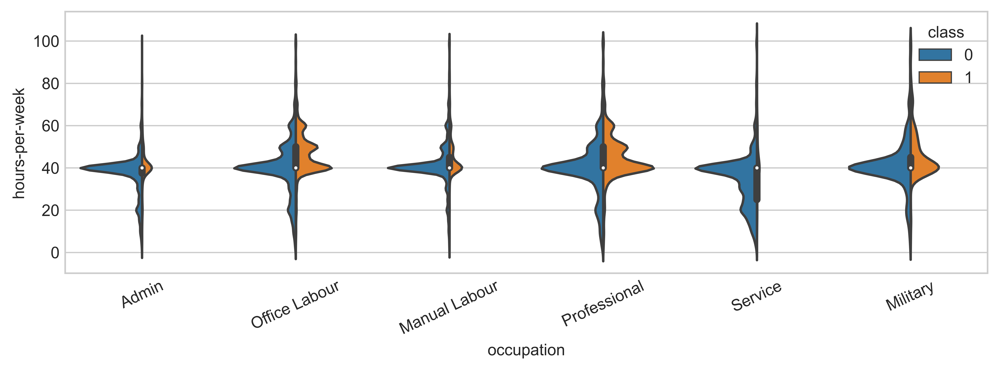

In [27]:
#职业和每周工作时间对收入的影响
plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(35,3))
plt.subplot(1,3,1)
plt.xticks(rotation=25)
sns.violinplot(x='occupation',y='hours-per-week',hue='class',data=dataset_con,split=True,scale='count')

<AxesSubplot:xlabel='workclass', ylabel='hours-per-week'>

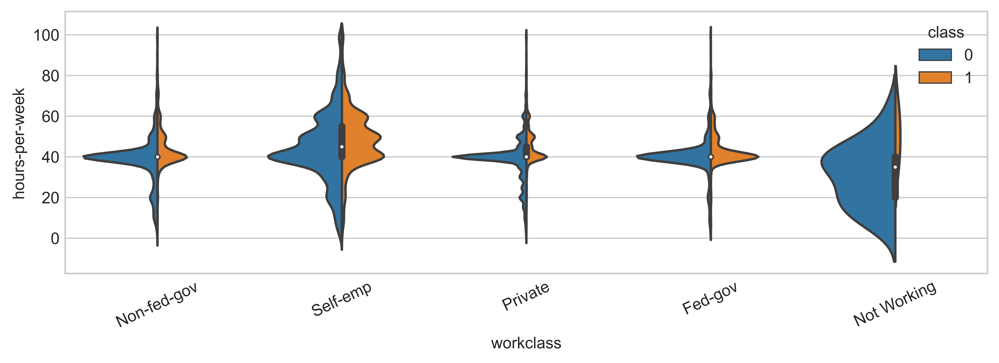

In [28]:
#工作类型和每周工作时间对收入的影响
plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(35,3))
plt.subplot(1,3,1)
plt.xticks(rotation=25)
sns.violinplot(x='workclass',y='hours-per-week',hue='class',data=dataset_con,split=True,scale='count')

In [34]:
#不同特征的散点图分布
fig = plt.figure(figsize=(5,1))
sns.pairplot(dataset_con[['workclass','occupation','hours-per-week','class']],hue='class',diag_kind='kde',size=6)

<Figure size 6000x1200 with 0 Axes>

In [36]:
#对特征进行编码

#one hot编码
one_hot_cols = dataset_bin.columns.tolist()
one_hot_cols.remove('class')
dataset_bin_enc = pd.get_dummies(dataset_bin,columns=one_hot_cols)
dataset_bin_enc.head()

,class,"hours-per-week_(0.902, 17.333]","hours-per-week_(17.333, 33.667]","hours-per-week_(33.667, 50.0]","hours-per-week_(50.0, 66.333]","hours-per-week_(66.333, 82.667]","hours-per-week_(82.667, 99.0]",workclass_Fed-gov,workclass_Non-fed-gov,workclass_Not Working,workclass_Private,workclass_Self-emp,occupation_Admin,occupation_Manual Labour,occupation_Military,occupation_Office Labour,occupation_Professional,occupation_Service
0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0
1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
2,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0
3,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0
4,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0


In [40]:
#label编码
dataset_con_test = dataset_con
dataset_con_test['class'] = dataset_con['class'].factorize()[0]
dataset_con_test['workclass'] = dataset_con['workclass'].factorize()[0]
dataset_con_test['occupation'] = dataset_con['occupation'].factorize()[0]
dataset_con_test['hours-per-week'] = dataset_con['hours-per-week'].factorize()[0]

dataset_con_enc = dataset_con_test.apply(LabelEncoder().fit_transform)
dataset_con_enc.head()

,class,hours-per-week,workclass,occupation
0,0,0,0,0
1,0,1,1,1
2,0,0,2,2
3,0,0,2,2
4,0,0,2,3


In [38]:
#由于这里确定了特征对收入的影响，所以不做特征相关性和重要性分析

In [71]:
#选择不同编码的数据集：离散或者非离散
selected_dataset = dataset_con_enc
#数据集切分
train = selected_dataset.loc[0:32560,:]
test = selected_dataset.loc[32560:,:]
#去掉缺失值
train = train.dropna(axis=0)
test = test.dropna(axis=0)
#重命名
X_train_w_label = train
X_train = train.drop(['class'],axis=1)
y_train = train['class'].astype('int64')
X_test = train.drop(['class'],axis=1)
y_test = train['class'].astype('int64')

In [72]:
X_train.shape

(32561, 3)

In [73]:
X_train.head()

,hours-per-week,workclass,occupation
0,0,0,0
1,1,1,1
2,0,2,2
3,0,2,2
4,0,2,3


In [74]:
y_train.head()

0    0
1    0
2    0
3    0
4    0
Name: class, dtype: int64

In [75]:
import random
random.seed(1)

In [94]:
#不同算法之间的ROC曲线

#在不同阈值threshold上计算fpr,tpc
def plot_roc_curve(y_test,preds):
    fpr,tpr,threshold = metrics.roc_curve(y_test,preds) #传入测试集和预测值
    roc_auc = metrics.auc(fpr,tpr) #计算出auc面积
    plt.title('ROC')
    plt.plot(fpr,tpr,'b',label='AUC = %0.2f' % roc_auc)
    plt.legend(loc = 'lower right')
    plt.plot([0,1],[0,1],'r--')
    plt.xlim([-0.01,1.01])
    plt.ylim([-0.01,1.01])
    plt.ylabel('TPR')
    plt.xlabel('FPR')
    plt.show()

In [95]:
#返回结果
def flt_ml_algo(algo,X_train,y_train,X_test,cv):
    #one pass
    model=algo.fit(X_train,y_train) #先进行模型训练
    test_pred = model.predict(X_test) #进行模型测试(预测)
    if(isinstance(algo,(LogisticRegression,
                        KNeighborsClassifier,
                        GaussianNB,
                        DecisionTreeClassifier,
                        RandomForestClassifier,
                        GradientBoostingClassifier))):
        probs = model.predict_proba(X_test)[:,1]
    else:
        probs = "Not Available"
    acc = round(model.score(X_test,y_test) * 100,2)
    #cv
    train_pred = model_selection.cross_val_predict(algo,
                                                  X_train,
                                                  y_train,
                                                  cv=cv,
                                                  n_jobs=-1)
    acc_cv = round(metrics.accuracy_score(y_train,train_pred) * 100,2)
    return train_pred,test_pred,acc,acc_cv,probs

In [96]:
#逻辑回归
import time
def report(results,n_top=5):
    for i in range(1, n_top + 1):
        candidates = np.flatnonzero(results['rank_test_score'] == i)

#确定参数
param_dist = {'penalty':['l2'],
              'class_weight':['balanced'],
              'C':np.logspace(-20,20,10000),
              'intercept_scaling':np.logspace(-20,20,10000)}

n_iter_search = 10
lrc = LogisticRegression()
#随机选取一组参数进行交叉验证
random_search = RandomizedSearchCV(lrc,
                                  n_jobs=-1,
                                  param_distributions=param_dist,
                                  n_iter=n_iter_search)
start=time.time()
random_search.fit(X_train,y_train)
report(random_search.cv_results_)

In [97]:
#打印结果-逻辑回归
train_pred_log,test_pred_log,acc_log,acc_cv_log,probs_log = flt_ml_algo(LogisticRegression(n_jobs = -1),
                                                                       X_train,
                                                                       y_train,
                                                                       X_test,
                                                                       10)
print('Accuracy：%s' % acc_log)
print('Accuracy CV-10：%s' % acc_cv_log)

Accuracy：75.92
Accuracy CV-10：75.92


In [98]:
#打印各个指标
print(metrics.classification_report(y_train,train_pred_log))

              precision    recall  f1-score   support

           0       0.76      1.00      0.86     24720
           1       0.00      0.00      0.00      7841

    accuracy                           0.76     32561
   macro avg       0.38      0.50      0.43     32561
weighted avg       0.58      0.76      0.66     32561



In [99]:
print(metrics.classification_report(y_test,train_pred_log))

              precision    recall  f1-score   support

           0       0.76      1.00      0.86     24720
           1       0.00      0.00      0.00      7841

    accuracy                           0.76     32561
   macro avg       0.38      0.50      0.43     32561
weighted avg       0.58      0.76      0.66     32561



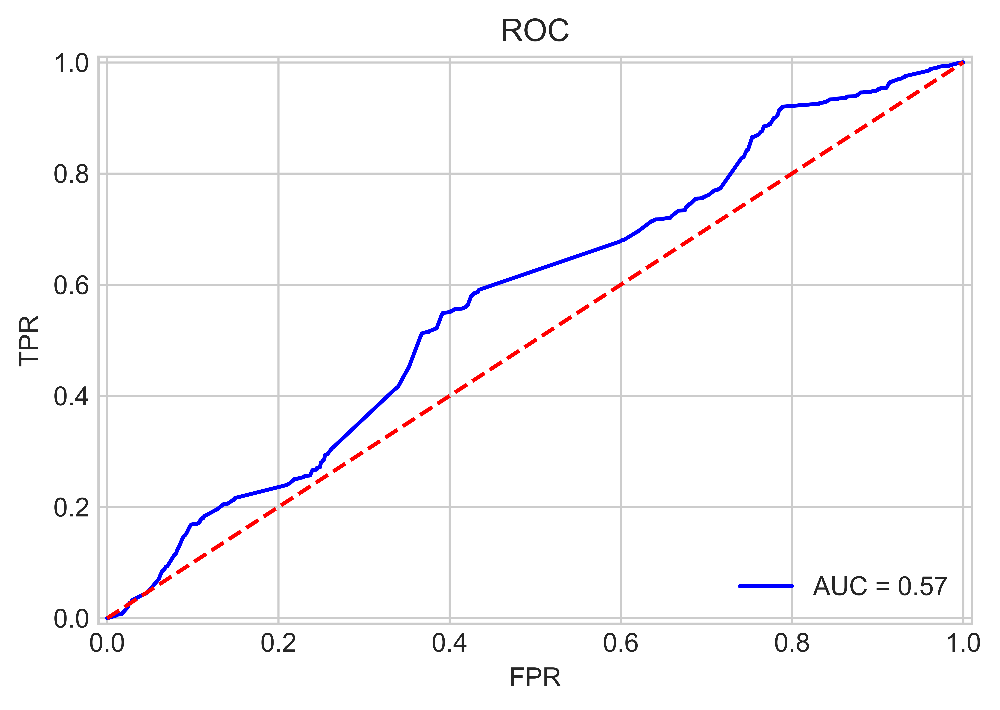

In [100]:
plot_roc_curve(y_test,probs_log)

In [101]:
#k值-近邻
train_pred_knn,test_pred_knn,acc_knn,acc_cv_knn,probs_knn = flt_ml_algo(KNeighborsClassifier(n_neighbors = 3),
                                                                       X_train,
                                                                       y_train,
                                                                       X_test,
                                                                       10)
print('Accuracy：%s' % acc_knn)
print('Accuracy CV-10：%s' % acc_cv_knn)

Accuracy：74.9
Accuracy CV-10：73.56


In [102]:
print(metrics.classification_report(y_train,train_pred_knn))

              precision    recall  f1-score   support

           0       0.81      0.85      0.83     24720
           1       0.44      0.36      0.40      7841

    accuracy                           0.74     32561
   macro avg       0.62      0.61      0.61     32561
weighted avg       0.72      0.74      0.73     32561



In [103]:
print(metrics.classification_report(y_test,train_pred_knn))

              precision    recall  f1-score   support

           0       0.81      0.85      0.83     24720
           1       0.44      0.36      0.40      7841

    accuracy                           0.74     32561
   macro avg       0.62      0.61      0.61     32561
weighted avg       0.72      0.74      0.73     32561



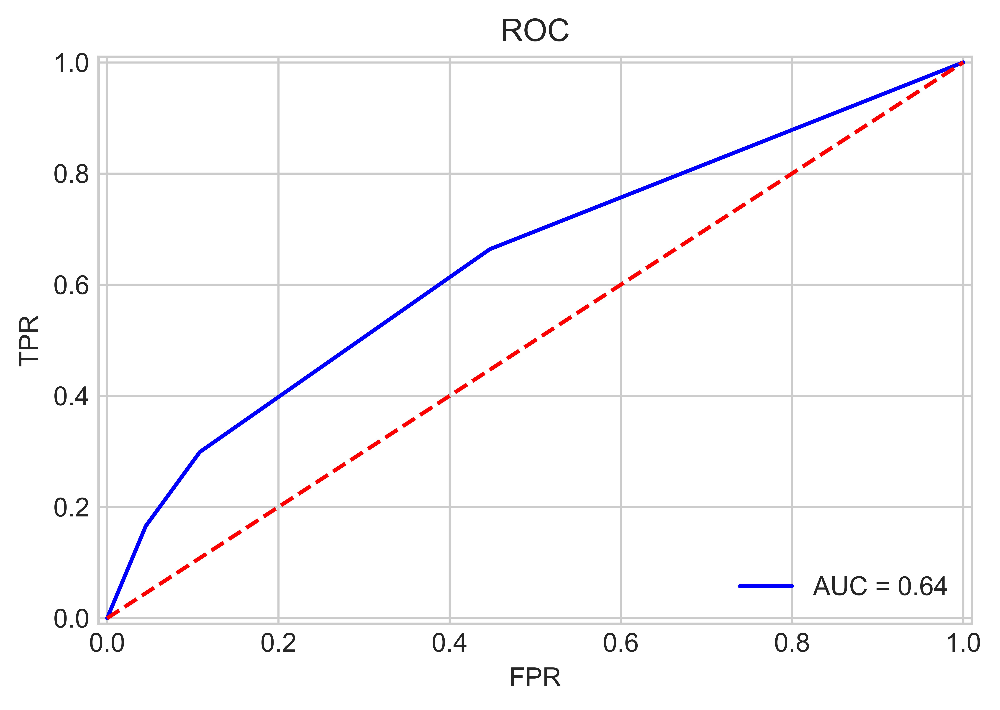

In [104]:
plot_roc_curve(y_test,probs_knn)

In [105]:
#贝叶斯
train_pred_gaussian,test_pred_gaussian,acc_gaussian,acc_cv_gaussian,probs_gaussian = flt_ml_algo(GaussianNB(),
                                                                       X_train,
                                                                       y_train,
                                                                       X_test,
                                                                       10)
print('Accuracy：%s' % acc_gaussian)
print('Accuracy CV-10：%s' % acc_cv_gaussian)

Accuracy：75.92
Accuracy CV-10：75.92


In [106]:
print(metrics.classification_report(y_train,train_pred_gaussian))

              precision    recall  f1-score   support

           0       0.76      1.00      0.86     24720
           1       0.00      0.00      0.00      7841

    accuracy                           0.76     32561
   macro avg       0.38      0.50      0.43     32561
weighted avg       0.58      0.76      0.66     32561



In [107]:
print(metrics.classification_report(y_test,train_pred_gaussian))

              precision    recall  f1-score   support

           0       0.76      1.00      0.86     24720
           1       0.00      0.00      0.00      7841

    accuracy                           0.76     32561
   macro avg       0.38      0.50      0.43     32561
weighted avg       0.58      0.76      0.66     32561



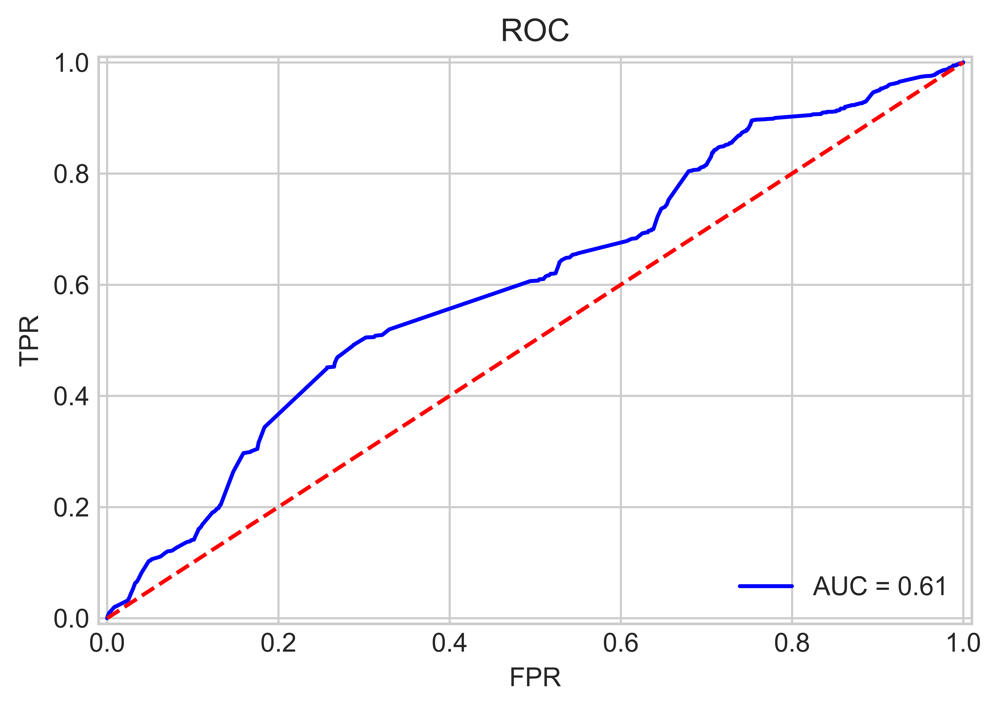

In [108]:
plot_roc_curve(y_test,probs_gaussian)

In [109]:
#数据汇总
models = pd.DataFrame({
    'Model':['LogisticRegression','KNeighborsClassifier','GaussianNB'],
    'Score':[acc_log,acc_knn,acc_gaussian]
})
models.sort_values(by='Score',ascending=False)

,Model,Score
0,LogisticRegression,75.92
2,GaussianNB,75.92
1,KNeighborsClassifier,74.90


In [112]:
#ROC汇总
plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(10,10))

models = [
    'LogisticRegression',
    'KNeighborsClassifier',
    'GaussianNB'
]

probs = [
    probs_log,
    probs_knn,
    probs_gaussian
]

colors = [
    'blue',
    'green',
    'red'
]

plt.title('ROC')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.01,1.01])
plt.ylim([-0.01,1.01])
plt.ylabel('TPR')
plt.xlabel('FPR')

def plot_roc_curves(y_test,prob,model):
    fpr,tpr,threshold = metrics.roc_curve(y_test,prob)
    roc_auc = metrics.auc(fpr,tpr)
    plt.plot(fpr,tpr,'b',label=model + ' AUC = %0.2f' % roc_auc,color = colors[i])
    plt.legend(loc = 'lower right')

for i,model in list(enumerate(models)):
    plot_roc_curves(y_test,probs[i],models[i])
plt.show()